# Ideia

### Visualizar como um grafo, fazendo a clusterização em sessões baseadas em gêneros. 
#### * Sessões com diversos genêros são sessões caóticas. <br> * Sessões com uma variação média de genêros são sessões moderadas. <br> * Sessões com o mesmo gênero são sessões monotemáticas.

### Os tópicos analisados são:

#### * Será que a sessão é menos pulada quando determinados generos aparecem juntos? <br> * Em que horario cada tipo de sessão acontece? <br> * Quais gêneros formam sessões mais duradouras e de que tipo? E as menores sessões? <br> * Criar as ilhas de cada gênero e relacionar uns com os outros


### Imports

In [33]:
import pandas as pd
import json
import networkx as nx
import os
import ast
import matplotlib.pyplot as plt
from dotenv import load_dotenv
from typing import Dict, Any

### Passo 0: Catar os dados
#### Autoexplicativo

In [34]:
def folder_to_df_merged(folder_path: str) -> Dict[str, pd.DataFrame]:
    result = {}

    for file in os.listdir(folder_path):
        if not file.endswith(".json"):
            continue

        path = os.path.join(folder_path, file)

        with open(path, encoding="utf-8") as f:
            data: Any = json.load(f)

        if isinstance(data, list) and all(isinstance(i, dict) for i in data):
            df = pd.json_normalize(data)

        elif isinstance(data, dict):
            list_keys = [k for k, v in data.items() if isinstance(v, list)]

            if list_keys:
                main_key = list_keys[0]
                df = pd.json_normalize(
                    data,
                    record_path=main_key,
                    meta=[k for k in data.keys() if k != main_key],
                    errors="ignore"
                )
            else:
                df = pd.DataFrame([data])

        else:
            df = pd.DataFrame()

        result[file.replace(".json", "")] = df
    
    return pd.concat(result.values(), ignore_index=True)

In [35]:

df = folder_to_df_merged("../data/raw")
#só pra tirar vazio no genero
df = df[df['genre'].apply(lambda x: isinstance(x, list) and len(x) > 0)]

display(df.head())

,ts,platform,ms_played,conn_country,ip_addr,master_metadata_track_name,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,episode_name,...,reason_start,reason_end,shuffle,skipped,offline,offline_timestamp,incognito_mode,user,artist_id,genre
2,2023-11-03T19:08:49Z,windows,114865,BR,200.185.254.31,Costa Rica (feat. The Kid LAROI) - Remix,Bankrol Hayden,Pain is Temporary,spotify:track:3tdjTdCCgKtwacsICCtPZZ,None,...,clickrow,trackdone,False,False,False,1.699038e+09,False,gigi,0Yr4BBpK2dkCp2UsrJ9LZN,[melodic rap]
4,2023-11-03T19:12:12Z,windows,90010,BR,191.23.42.158,Blueberry Faygo,Lil Mosey,Blueberry Faygo,spotify:track:6wJYhPfqk3KGhHRG76WzOh,None,...,playbtn,unexpected-exit,False,False,False,1.699039e+09,False,gigi,6Xgp2XMz1fhVYe7i6yNAax,[melodic rap]
5,2023-11-03T21:44:28Z,windows,159129,BR,191.23.42.158,Blueberry Faygo,Lil Mosey,Blueberry Faygo,spotify:track:6wJYhPfqk3KGhHRG76WzOh,None,...,appload,trackdone,False,False,False,1.699047e+09,False,gigi,6Xgp2XMz1fhVYe7i6yNAax,[melodic rap]
6,2023-11-03T21:47:12Z,windows,162546,BR,191.23.42.158,Blueberry Faygo,Lil Mosey,Blueberry Faygo,spotify:track:6wJYhPfqk3KGhHRG76WzOh,None,...,trackdone,trackdone,False,False,False,1.699048e+09,False,gigi,6Xgp2XMz1fhVYe7i6yNAax,[melodic rap]
7,2023-11-03T21:49:55Z,windows,162546,BR,191.23.42.158,Blueberry Faygo,Lil Mosey,Blueberry Faygo,spotify:track:6wJYhPfqk3KGhHRG76WzOh,None,...,trackdone,trackdone,False,False,False,1.699048e+09,False,gigi,6Xgp2XMz1fhVYe7i6yNAax,[melodic rap]


## Passo 1: Criar sessões por tempo de reprodução sem interrupção
#### Fazer grupos pelo tempo que o usuário escutou música sem pausar ou sair do aplicativo
##### A regra é: Se em algum momento tem uma diferença maior que 20 minutos na reprodução, então a sessão terminou

In [36]:
def get_session_by_timestamp(df, user_col='user'):
    df = df.copy()
    df['ts'] = pd.to_datetime(df['ts'])
    df.sort_values([user_col, 'ts'], inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    df['init'] = df['ts'] - pd.to_timedelta(df['ms_played'], unit='ms')
    prev_ts = df.groupby(user_col)['ts'].shift(1)
    df['silencio_sec'] = (df['init'] - prev_ts).dt.total_seconds()
    
    limite_gap = 1200
    df['new_session'] = (df['silencio_sec'] > limite_gap) | (df['silencio_sec'].isna())
    session_num = df.groupby(user_col)['new_session'].cumsum()
    df['session_id'] = df[user_col].astype(str) + '_' + session_num.astype(str)
    
    return df

In [37]:
df_base = df.copy()
df_session = get_session_by_timestamp(df_base)
df_session
#os valores negativo é atraso de internet ou aql transição q o spotify faz antes da msc acabar, vulgo crossfade

,ts,platform,ms_played,conn_country,ip_addr,master_metadata_track_name,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,episode_name,...,offline,offline_timestamp,incognito_mode,user,artist_id,genre,init,silencio_sec,new_session,session_id
0,2020-02-06 00:03:38+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",8017,BR,179.209.11.154,Renegado,MHRAP,Renegado,spotify:track:0AVKyOsOy97MW8oKRmFmWP,None,...,False,NaN,False,Allanabre,2563ILWHSx52eOxOoi5rJW,"[anime rap, anime]",2020-02-06 00:03:29.983000+00:00,NaN,True,Allanabre_1
1,2020-02-06 00:04:18+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",17250,BR,179.209.11.154,Te Falta Odio,7 Minutoz,Te Falta Odio,spotify:track:3H4VLx9brB3yVon6VbixxI,None,...,False,NaN,False,Allanabre,2563ILWHSx52eOxOoi5rJW,"[anime rap, anime]",2020-02-06 00:04:00.750000+00:00,22.750,False,Allanabre_1
2,2020-02-06 00:13:19+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",34653,BR,179.209.11.154,Um Corno Solitário,Lil' Lixo,Um Corno Solitário,spotify:track:6tb3tULXrlHX2l3E9SYqPB,None,...,False,NaN,False,Allanabre,1SQRCcEVpAcFpvjBbqEB1w,"[brazilian trap, trap]",2020-02-06 00:12:44.347000+00:00,506.347,False,Allanabre_1
3,2020-02-06 00:13:24+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",4614,BR,179.209.11.154,Canção Infantil,Pineapple StormTv,Canção Infantil,spotify:track:5yzYGjKIHJA4DNgDwBB8a7,None,...,False,NaN,False,Allanabre,09U6hmCerKcIJrixubiBjm,"[brazilian hip hop, brazilian trap]",2020-02-06 00:13:19.386000+00:00,0.386,False,Allanabre_1
4,2020-02-06 00:17:33+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",5857,BR,179.209.11.154,Kurt Cobain - Acústico,UCLÃ,Acústico Duzz,spotify:track:5rNHchF00RDf45YhWXBBOX,None,...,False,NaN,False,Allanabre,4oPnjkJcLqOim9KJxvIYMz,"[brazilian trap, brazilian hip hop, trap]",2020-02-06 00:17:27.143000+00:00,243.143,False,Allanabre_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183094,2024-02-18 23:49:06+00:00,windows,282352,BR,191.17.184.92,Ela Vem (SET DJ NENE),MC GP,Ela Vem (SET DJ NENE),spotify:track:2l3qol4Ji7laBQtGxzJguJ,None,...,False,1.708300e+09,False,gigi,5s27i7oqhNWIcE4HeoVdq0,"[brazilian funk, funk consciente, trap funk]",2024-02-18 23:44:23.648000+00:00,0.648,False,gigi_2268
183095,2024-02-18 23:50:34+00:00,windows,86861,BR,191.17.184.92,"Lean na Fanta (feat. Derek, Dfideliz, MC Igu &...",Recayd Mob,Calzone Tapes 3,spotify:track:2L0u8cn67KPS2vjHXVakan,None,...,False,1.708300e+09,False,gigi,1QBWA6tuiZ0JuDluPqbe71,"[brazilian trap, trap, brazilian hip hop]",2024-02-18 23:49:07.139000+00:00,1.139,False,gigi_2268
183096,2024-02-18 23:53:01+00:00,windows,146576,BR,191.17.184.92,Chá,REAL PS,Chá,spotify:track:1jmKwXRbjrFLnjxQ32GizK,None,...,False,1.708300e+09,False,gigi,6UsSaIItK9LmnCczyW2B8I,[brazilian trap],2024-02-18 23:50:34.424000+00:00,0.424,False,gigi_2268
183097,2024-02-18 23:55:44+00:00,windows,161931,BR,191.17.184.92,Moreno Tatuado,PK Delas,Moreno Tatuado,spotify:track:4EfDnPfBq3zYFtkaVCElPq,None,...,False,1.708300e+09,False,gigi,5xYkM2vMrE23taj6tl7qkm,"[brazilian funk, trap funk, brazilian hip hop]",2024-02-18 23:53:02.069000+00:00,1.069,False,gigi_2268


### Passo 2: Criar as sessões
#### Criar as sessões baseadas no clusters, aqui a gente divide as sessões entre monotemática, moderada e caótica

In [38]:
def session_type(df,count):
    if count <= 1: 
        return 'Monotemática'
    elif count <= 5: 
        return 'Moderada'
    else: 
        return 'Caótica'

In [39]:
# Garantir coluna de gênero para as análises por sessão
if 'genre' not in df_session.columns:
    if 'genre' in df_session.columns:
        df_session_genre = df_session.copy()
        df_session_genre = df_session_genre.explode('genre')
        df_session_genre = df_session_genre.rename(columns={'genre': 'genre'})
        df_session_genre = df_session_genre[df_session_genre['genre'].notna()]
    else:
        raise KeyError("Coluna 'genre' (ou 'genre') não encontrada no DataFrame")
else:
    df_session_genre = df_session.copy()


df_session_genre = df_session.copy()

df_session_genre = df_session_genre.explode("genre")

genre_counts_per_session = (
    df_session_genre
    .groupby(['session_id', 'genre'])
    .size()
    .reset_index(name='count')
    .sort_values(['session_id', 'count'], ascending=[True, False])
)
genre_counts_per_session = genre_counts_per_session.sort_values(['session_id', 'count'], ascending=[True, False])
display(genre_counts_per_session.head(10))

# Aq ele conta os generos unicos q aparecem na sessão, a lista dos generos e o tipo da sessão
unique_genre_per_session = df_session_genre.groupby(['user', 'session_id']).agg({
    'genre': ['nunique', 'unique'],
    'init': 'min',
    'ts': 'max'
}).reset_index()

unique_genre_per_session.columns = ['user', 'session_id', 'unique_genre_count', 'genre_list', 'session_start', 'session_end']

unique_genre_per_session['session_type'] = unique_genre_per_session['unique_genre_count'].apply(lambda x: session_type(df_session_genre, x))

display(unique_genre_per_session[['user', 'session_id', 'unique_genre_count', 'genre_list', 'session_type']].head(10))

,session_id,genre,count
4,Allanabre_1,k-pop,4
3,Allanabre_1,brazilian trap,3
5,Allanabre_1,k-rap,3
0,Allanabre_1,anime,2
1,Allanabre_1,anime rap,2
2,Allanabre_1,brazilian hip hop,2
7,Allanabre_1,trap,2
6,Allanabre_1,pop,1
8,Allanabre_10,anime,1
9,Allanabre_10,anime rap,1


,user,session_id,unique_genre_count,genre_list,session_type
0,Allanabre,Allanabre_1,8,"[anime rap, anime, brazilian trap, trap, brazi...",Caótica
1,Allanabre,Allanabre_10,9,"[brazilian hip hop, sertanejo tradicional, ser...",Caótica
2,Allanabre,Allanabre_100,6,"[piseiro, forró, arrocha, sertanejo, brega, fo...",Caótica
3,Allanabre,Allanabre_101,6,"[piseiro, forró, arrocha, sertanejo, brega, fo...",Caótica
4,Allanabre,Allanabre_102,1,[egg punk],Monotemática
5,Allanabre,Allanabre_103,7,"[egg punk, piseiro, forró, arrocha, sertanejo,...",Caótica
6,Allanabre,Allanabre_104,9,"[piseiro, forró, arrocha, sertanejo, brega, fo...",Caótica
7,Allanabre,Allanabre_105,6,"[piseiro, forró, arrocha, sertanejo, brega, fo...",Caótica
8,Allanabre,Allanabre_106,8,"[piseiro, forró, arrocha, sertanejo, brega, fo...",Caótica
9,Allanabre,Allanabre_107,9,"[piseiro, forró, arrocha, sertanejo, brega, fo...",Caótica


In [40]:
# Se a coluna já existir, remove antes de fazer o merge novamente, é q tava duplicando session_type
cols_to_drop = [c for c in df_session.columns if 'session_type' in c]
if cols_to_drop:
    df_session = df_session.drop(columns=cols_to_drop)

# adiciona td no df principal
df_session = df_session.merge(unique_genre_per_session[['session_id', 'session_type']], on='session_id', how='left')

display(df_session)

,ts,platform,ms_played,conn_country,ip_addr,master_metadata_track_name,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,episode_name,...,offline_timestamp,incognito_mode,user,artist_id,genre,init,silencio_sec,new_session,session_id,session_type
0,2020-02-06 00:03:38+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",8017,BR,179.209.11.154,Renegado,MHRAP,Renegado,spotify:track:0AVKyOsOy97MW8oKRmFmWP,None,...,NaN,False,Allanabre,2563ILWHSx52eOxOoi5rJW,"[anime rap, anime]",2020-02-06 00:03:29.983000+00:00,NaN,True,Allanabre_1,Caótica
1,2020-02-06 00:04:18+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",17250,BR,179.209.11.154,Te Falta Odio,7 Minutoz,Te Falta Odio,spotify:track:3H4VLx9brB3yVon6VbixxI,None,...,NaN,False,Allanabre,2563ILWHSx52eOxOoi5rJW,"[anime rap, anime]",2020-02-06 00:04:00.750000+00:00,22.750,False,Allanabre_1,Caótica
2,2020-02-06 00:13:19+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",34653,BR,179.209.11.154,Um Corno Solitário,Lil' Lixo,Um Corno Solitário,spotify:track:6tb3tULXrlHX2l3E9SYqPB,None,...,NaN,False,Allanabre,1SQRCcEVpAcFpvjBbqEB1w,"[brazilian trap, trap]",2020-02-06 00:12:44.347000+00:00,506.347,False,Allanabre_1,Caótica
3,2020-02-06 00:13:24+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",4614,BR,179.209.11.154,Canção Infantil,Pineapple StormTv,Canção Infantil,spotify:track:5yzYGjKIHJA4DNgDwBB8a7,None,...,NaN,False,Allanabre,09U6hmCerKcIJrixubiBjm,"[brazilian hip hop, brazilian trap]",2020-02-06 00:13:19.386000+00:00,0.386,False,Allanabre_1,Caótica
4,2020-02-06 00:17:33+00:00,"Android OS 7.1.1 API 25 (motorola, Moto G Play)",5857,BR,179.209.11.154,Kurt Cobain - Acústico,UCLÃ,Acústico Duzz,spotify:track:5rNHchF00RDf45YhWXBBOX,None,...,NaN,False,Allanabre,4oPnjkJcLqOim9KJxvIYMz,"[brazilian trap, brazilian hip hop, trap]",2020-02-06 00:17:27.143000+00:00,243.143,False,Allanabre_1,Caótica
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183094,2024-02-18 23:49:06+00:00,windows,282352,BR,191.17.184.92,Ela Vem (SET DJ NENE),MC GP,Ela Vem (SET DJ NENE),spotify:track:2l3qol4Ji7laBQtGxzJguJ,None,...,1.708300e+09,False,gigi,5s27i7oqhNWIcE4HeoVdq0,"[brazilian funk, funk consciente, trap funk]",2024-02-18 23:44:23.648000+00:00,0.648,False,gigi_2268,Caótica
183095,2024-02-18 23:50:34+00:00,windows,86861,BR,191.17.184.92,"Lean na Fanta (feat. Derek, Dfideliz, MC Igu &...",Recayd Mob,Calzone Tapes 3,spotify:track:2L0u8cn67KPS2vjHXVakan,None,...,1.708300e+09,False,gigi,1QBWA6tuiZ0JuDluPqbe71,"[brazilian trap, trap, brazilian hip hop]",2024-02-18 23:49:07.139000+00:00,1.139,False,gigi_2268,Caótica
183096,2024-02-18 23:53:01+00:00,windows,146576,BR,191.17.184.92,Chá,REAL PS,Chá,spotify:track:1jmKwXRbjrFLnjxQ32GizK,None,...,1.708300e+09,False,gigi,6UsSaIItK9LmnCczyW2B8I,[brazilian trap],2024-02-18 23:50:34.424000+00:00,0.424,False,gigi_2268,Caótica
183097,2024-02-18 23:55:44+00:00,windows,161931,BR,191.17.184.92,Moreno Tatuado,PK Delas,Moreno Tatuado,spotify:track:4EfDnPfBq3zYFtkaVCElPq,None,...,1.708300e+09,False,gigi,5xYkM2vMrE23taj6tl7qkm,"[brazilian funk, trap funk, brazilian hip hop]",2024-02-18 23:53:02.069000+00:00,1.069,False,gigi_2268,Caótica


### Passo 3: Criar as ilhas (vulgo o grafo)
#### Criar as ilhas usando a biblioteca networkx do python
##### Basicamente, a forma que vamos criar as ilhas é através de uma simulação física, a qual a aresta tem uma força, a partir disso, ele forma a relação entre as linhas. Tamo usando um algoritmo chamado Force-Directed Layout, q é tudo isso ai q eu expliquei
##### Na prática fica assim: <br><br> * Nós: Gêneros musicais. <br> * Arestas: A relação entre os gêneros musicais de umam mesma sessão. <br> * Fricção (Skip): Se você pula uma música, essa aresta não é criada (ou é penalizada). Isso mostra onde a tolerância do usuário falha.
##### As conexões funcionam se: <br><br> * For na MESMA sessão (session_id == next_session) <br> * A música atual NÃO foi pulada (skipped == False) <br> * Ignoramos gêneros nulos
##### PS: Pra ver o grafo melhor tem q abrir ele

##### Esse aq ficou mais bostinha pq n usa o session_type

Analisando usuário: Allanabre
Top 10 Conexões mais fortes:


,genre,next_genre,weight
56,anime rap,anime,1491
21,anime,anime rap,1160
681,piseiro,forró,544
385,forró,arrocha,544
263,brega,forró tradicional,503
732,sertanejo,brega,503
86,arrocha,sertanejo,503
158,brazilian funk,brazilian funk,414
645,new mpb,brazilian rock,404
112,bedroom pop,bedroom pop,307


Filtrando grafo: Exibindo apenas conexões com peso >= 37.0


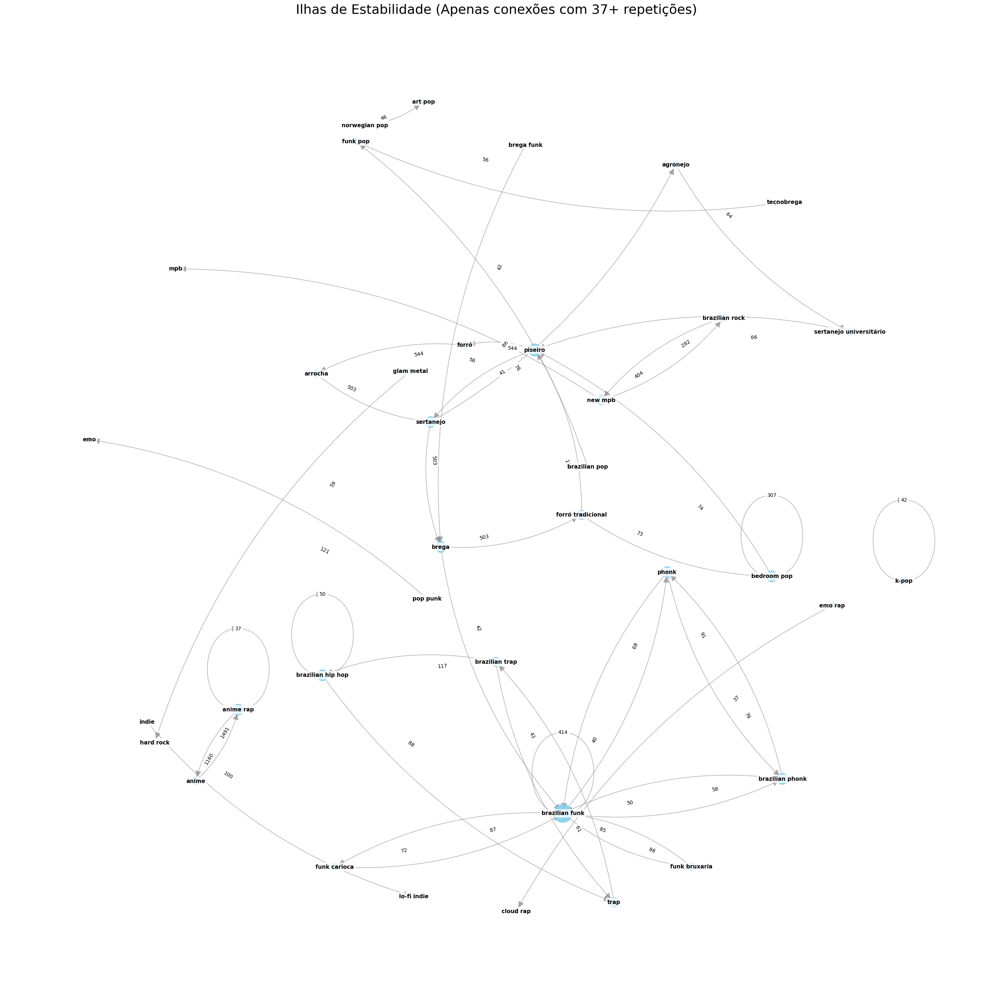

Analisando usuário: Cury
Top 10 Conexões mais fortes:


,genre,next_genre,weight
204,brazilian rock,mpb,9814
569,mpb,brazilian pop,9457
154,brazilian pop,brazilian rock,5822
437,glam metal,hard rock,947
477,hard rock,classic rock,886
772,rock,glam metal,875
181,brazilian pop,pop rock,865
570,mpb,brazilian rock,757
744,rap metal,rock,728
623,nu metal,rap metal,725


Filtrando grafo: Exibindo apenas conexões com peso >= 87.3


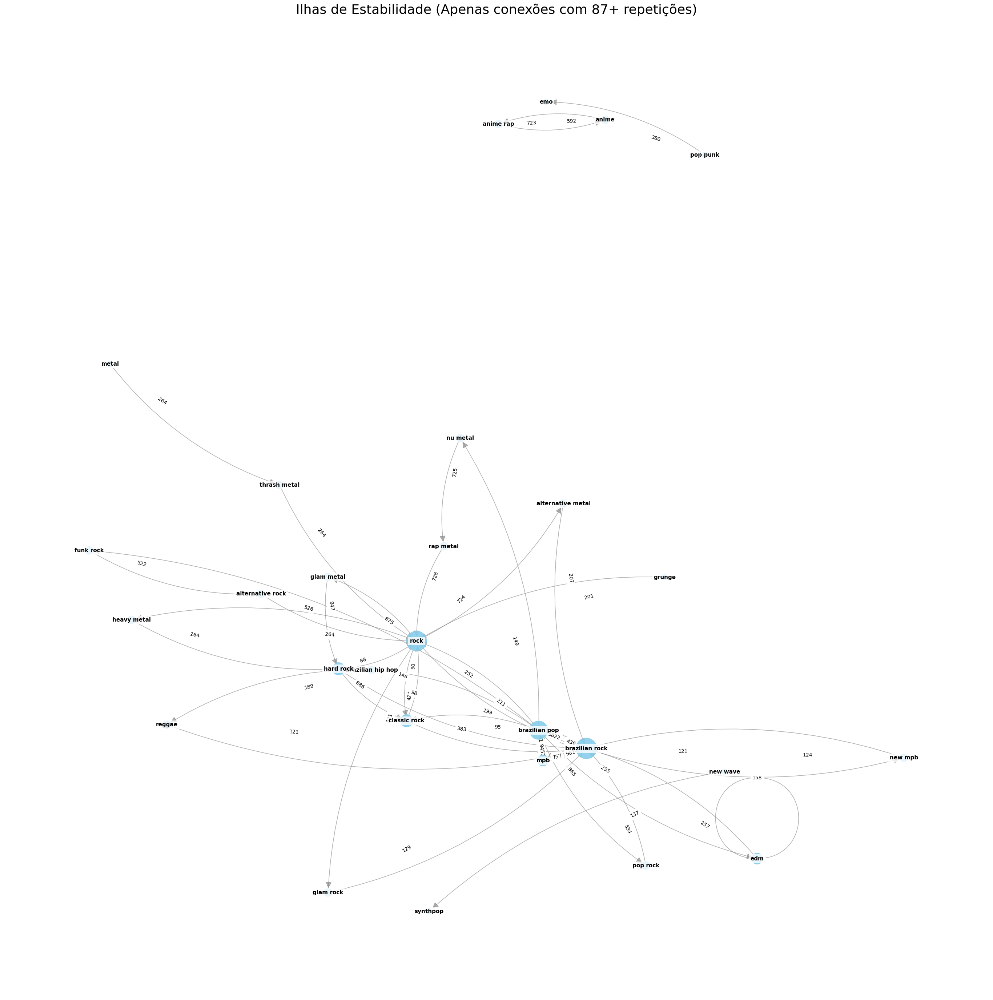

Analisando usuário: Fefo
Top 10 Conexões mais fortes:


,genre,next_genre,weight
724,funk de bh,brazilian funk,937
224,brazilian funk,funk de bh,794
1451,trap,brazilian hip hop,517
223,brazilian funk,funk consciente,493
718,funk consciente,brega funk,454
333,brazilian trap,trap,433
1490,trap funk,trap,410
686,funk carioca,brazilian funk,407
277,brazilian hip hop,trap funk,402
838,indie,lo-fi indie,380


Filtrando grafo: Exibindo apenas conexões com peso >= 37.0


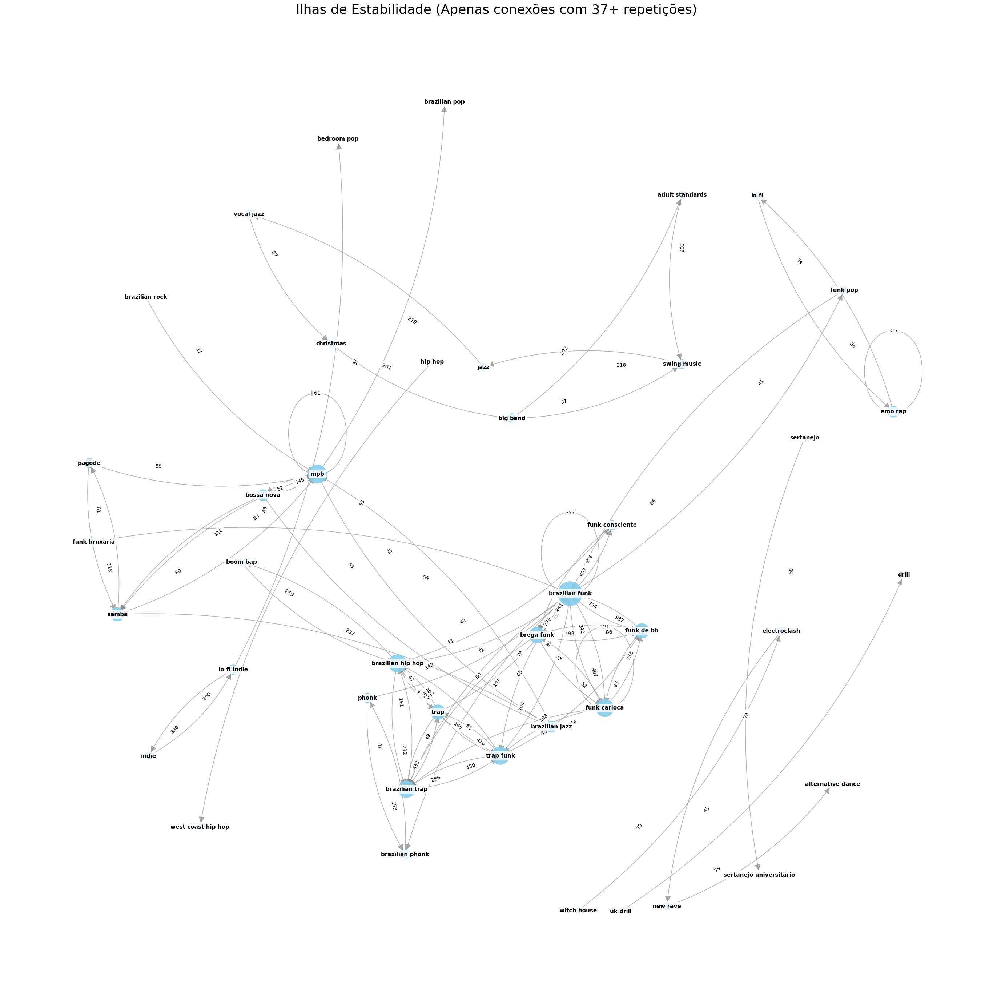

Analisando usuário: Gueguelas
Top 10 Conexões mais fortes:


,genre,next_genre,weight
790,brazilian trap,trap,5892
3283,rap metal,rock,5186
3744,trap,brazilian hip hop,4985
3869,trap funk,trap,4543
3231,rap,hip hop,4320
569,brazilian hip hop,brazilian trap,3825
791,brazilian trap,trap funk,3771
638,brazilian hip hop,trap funk,3748
111,alternative metal,rap metal,3517
3796,trap,trap funk,3402


Filtrando grafo: Exibindo apenas conexões com peso >= 127.0


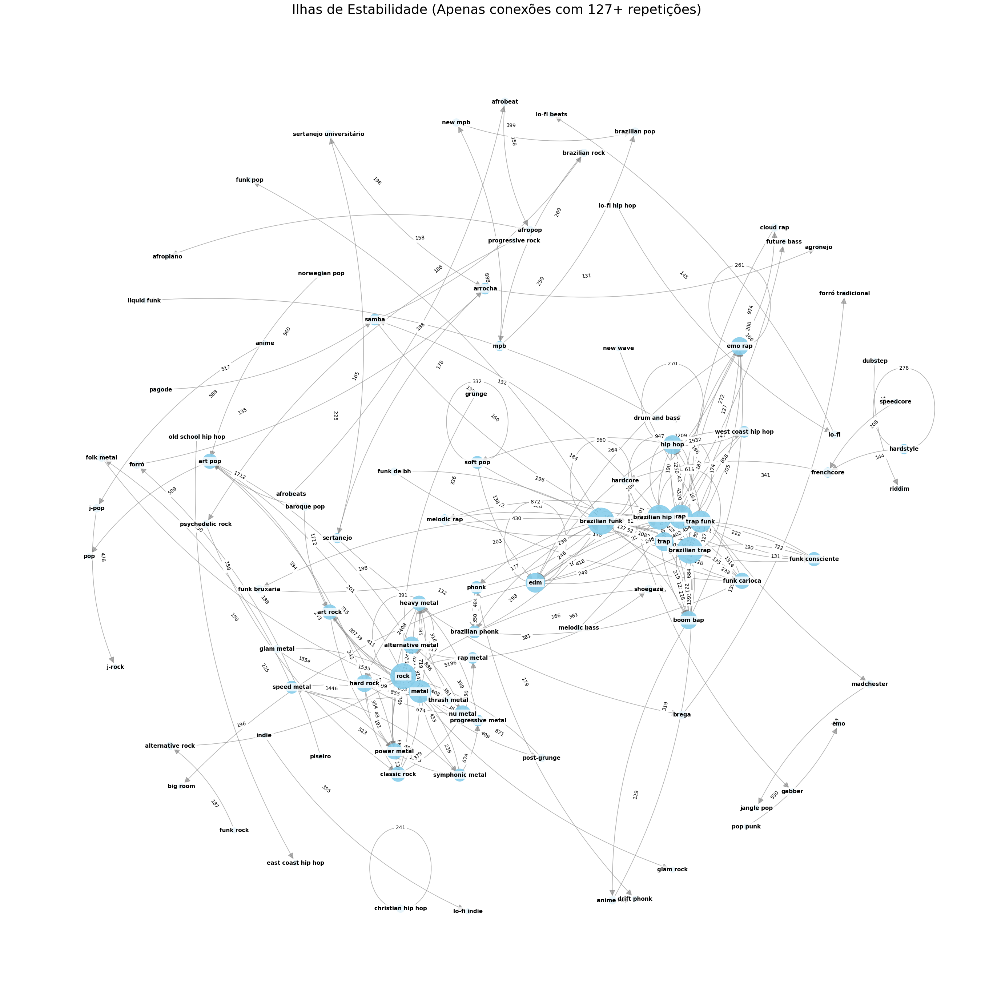

Analisando usuário: gigi
Top 10 Conexões mais fortes:


,genre,next_genre,weight
894,trap funk,trap,5961
848,trap,brazilian hip hop,5423
250,brazilian trap,trap funk,5406
172,brazilian hip hop,brazilian trap,5307
249,brazilian trap,trap,2474
235,brazilian trap,brazilian hip hop,1561
867,trap,trap funk,1457
876,trap funk,brazilian hip hop,1405
160,brazilian funk,trap funk,1379
878,trap funk,brazilian trap,1079


Filtrando grafo: Exibindo apenas conexões com peso >= 280.0


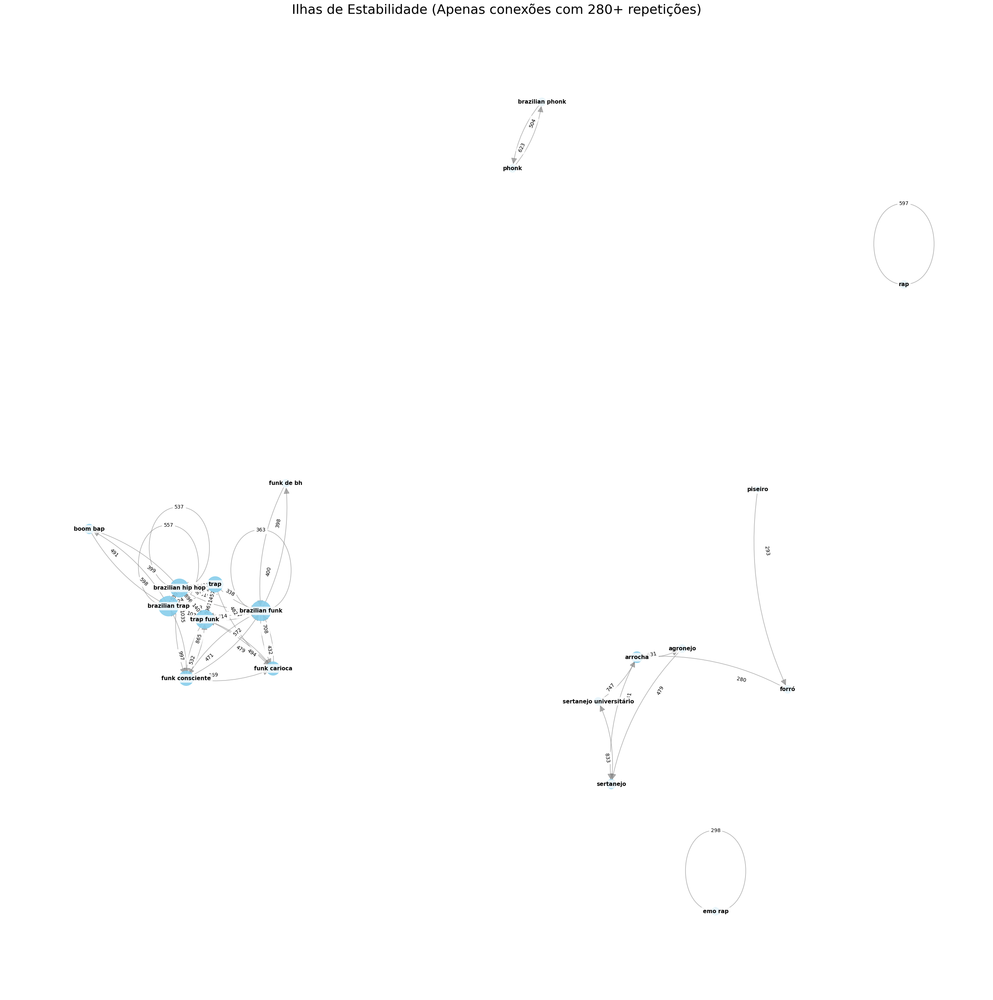

In [41]:
# só pra garantir q ta ordenado, EU TENHO QUASE CTZ Q É A TERCEIRA VEZ Q FAÇO ISSO MAS TD VEZ ESQUEÇO DE OLHAR
for user in df_session['user'].unique():
    print(f"Analisando usuário: {user}")
    df_session = df_session.sort_values('ts')
    df_user = df_session[df_session['user'] == user].copy()

    # Explode a lista de generos para que cada linha tenha um unico genero
    # Isso permite agrupar e criar o grafo corretamente
    if 'genre' in df_user.columns:
        df_user = df_user.explode('genre')
        df_user = df_user.rename(columns={'genre': 'genre'})

    # pegamo o genero da proxima linha e a sessão da próxima linha pra comparar depois
    df_user['next_genre'] = df_user['genre'].shift(-1)
    df_user['next_session'] = df_user['session_id'].shift(-1)

    # Verificar se a coluna 'skipped' existe
    if 'skipped' not in df_user.columns:
        df_user['skipped'] = False

    conexoes = df_user[
        (df_user['session_id'] == df_user['next_session']) &
        (df_user['skipped'] == False) &
        (df_user['genre'].notna()) &
        (df_user['next_genre'].notna())
    ].copy()

    # peso da aresta, conta quantas vezes aconteceu
    arestas = conexoes.groupby(['genre', 'next_genre']).size().reset_index(name='weight')

    # Ordenar para ver as mais fortes
    print("Top 10 Conexões mais fortes:")
    display(arestas.sort_values('weight', ascending=False).head(10))


    # Pega o percentil 95 (Top 5% das conexões mais frequentes) ou no mínimo peso 5
    thresh_val = arestas['weight'].quantile(0.95)
    limiar_peso = max(thresh_val, 5)

    print(f"Filtrando grafo: Exibindo apenas conexões com peso >= {limiar_peso:.1f}")

    plt.figure(figsize=(35, 35))
    G = nx.DiGraph()

    for _, row in arestas.iterrows():
        if row['weight'] >= limiar_peso:
            G.add_edge(row['genre'], row['next_genre'], weight=row['weight'])

    # Layout (Mantendo bem espaçado)
    pos = nx.spring_layout(G, k=12, weight='weight', seed=42, iterations=200)

    # Tamanho dos nós
    d = dict(G.degree)
    node_sizes = [v * 120 for v in d.values()]

    # Nós
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='#87CEEB', alpha=0.9)

    # Arestas (Espessura fixa para visualização clara)
    nx.draw_networkx_edges(G, pos, width=1.2, alpha=0.6, edge_color='grey',
                        arrows=True, arrowstyle='-|>', arrowsize=25,
                        connectionstyle="arc3,rad=0.15")

    # Labels Gêneros
    nx.draw_networkx_labels(G, pos, font_size=11, font_weight='bold',
                            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=3))

    # Labels PESOS
    edge_labels = { (u, v): d['weight'] for u, v, d in G.edges(data=True) }
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10, label_pos=0.3)

    plt.title(f"Ilhas de Estabilidade (Apenas conexões com {int(limiar_peso)}+ repetições)", fontsize=26)
    plt.axis('off')
    plt.show()

##### Esse aq ta daorinha pq usa o session_type

Analisando usuário: Gueguelas


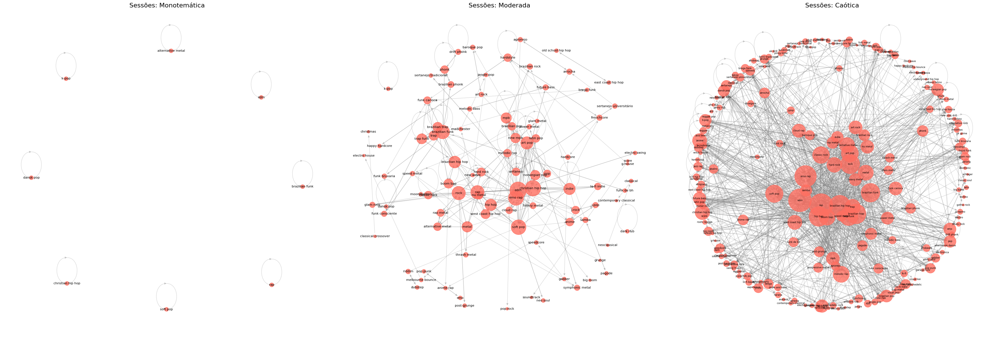

Analisando usuário: Cury


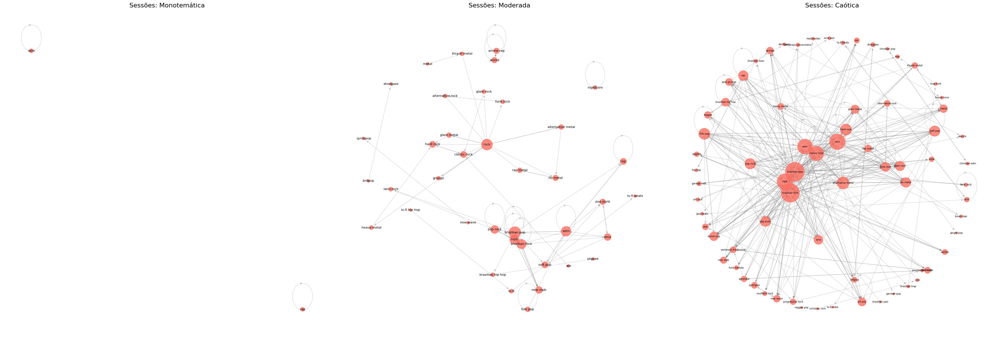

Analisando usuário: Allanabre


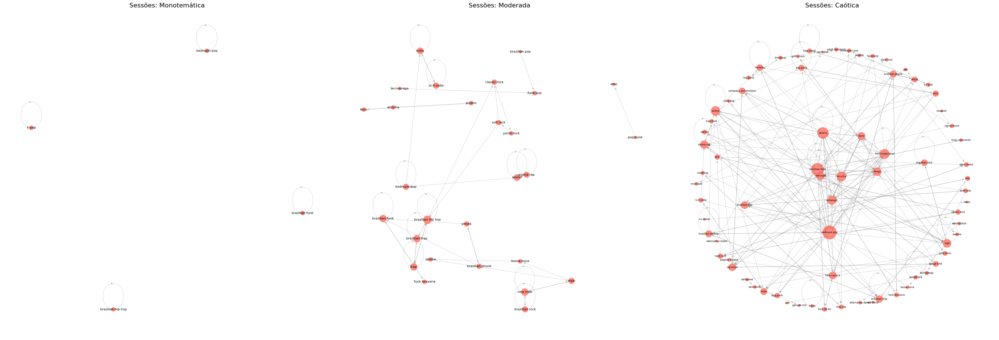

Analisando usuário: Fefo


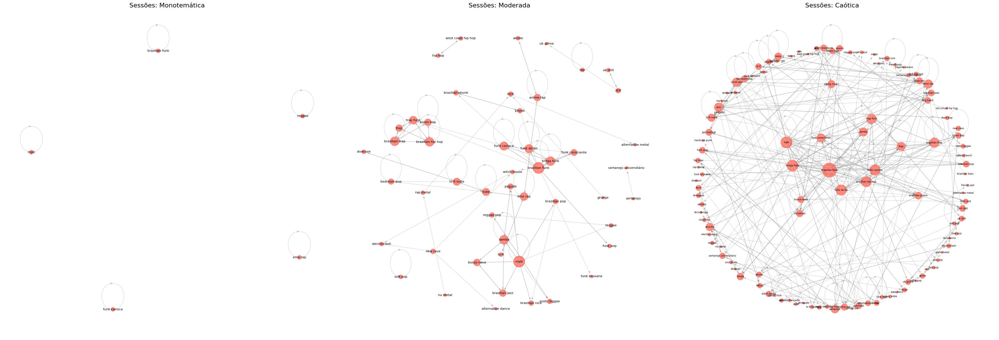

Analisando usuário: gigi


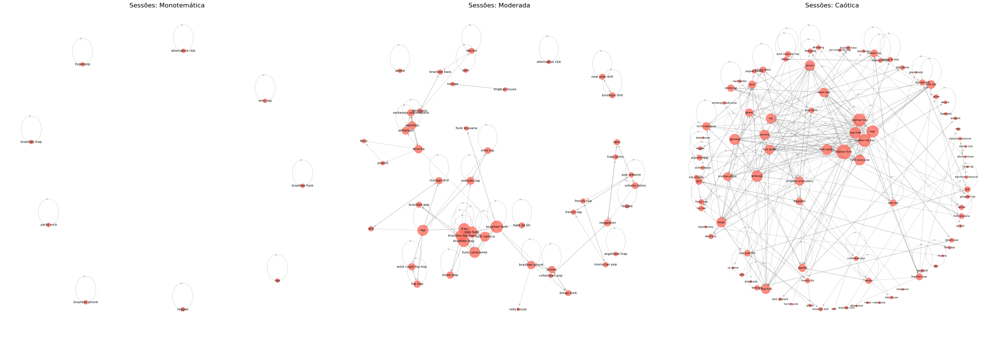

In [42]:
for user in df_session['user'].unique():
    # Configuração do plot (3 gráficos lado a lado)
    fig, axes = plt.subplots(1, 3, figsize=(35, 12))
    tipos = ['Monotemática', 'Moderada', 'Caótica']
    df_user = df_session[df_session['user'] == user].copy()
    print(f"Analisando usuário: {user}")

    # Explode a lista de gêneros para trabalhar com um gênero por linha
    if 'genre' in df_user.columns:
        df_user = df_user.explode('genre')
        df_user = df_user.rename(columns={'genre': 'genre'})

    # Ordena e cria colunas de próxima faixa dentro do usuário
    df_user = df_user.sort_values('ts')
    df_user['next_genre'] = df_user['genre'].shift(-1)
    df_user['next_session'] = df_user['session_id'].shift(-1)

    # Verificar se a coluna 'skipped' existe
    if 'skipped' not in df_user.columns:
        df_user['skipped'] = False

    # Conexões somente do usuário atual
    conexoes_user = df_user[
        (df_user['session_id'] == df_user['next_session']) &
        (df_user['skipped'] == False) &
        (df_user['genre'].notna()) &
        (df_user['next_genre'].notna())
    ].copy()

    for i, tipo in enumerate(tipos):
        subset_conexoes = conexoes_user[conexoes_user['session_type'] == tipo]

        # Conta pesos
        edges = subset_conexoes.groupby(['genre', 'next_genre']).size().reset_index(name='weight')

        # Filtra ruído
        min_weight = 5
        edges = edges[edges['weight'] >= min_weight]

        # Grafo
        G_sub = nx.DiGraph()
        for _, row in edges.iterrows():
            G_sub.add_edge(row['genre'], row['next_genre'], weight=row['weight'])

        # 4. Desenhar
        ax = axes[i]
        if len(G_sub.nodes) > 0:
            #isso aq é pra espaçar pq se n complica pra ver, nem sei de mudou de fato
            if tipo == 'Caótica':
                pos = nx.spring_layout(G_sub, k=15, seed=42, iterations=200)
                sizes = [val * 30 for node, val in G_sub.degree()]
            else:
                pos = nx.spring_layout(G_sub, k=1.5, seed=42)
                sizes = [val * 50 for node, val in G_sub.degree()]

            nx.draw_networkx_nodes(G_sub, pos, node_size=sizes, node_color='#FF6F61', alpha=0.8, ax=ax)
            nx.draw_networkx_edges(G_sub, pos, alpha=0.3, edge_color='gray', arrows=True, ax=ax)

            font_s = 6 if tipo == 'Caótica' else 8
            nx.draw_networkx_labels(G_sub, pos, font_size=font_s, ax=ax)

        ax.set_title(f"Sessões: {tipo}", fontsize=16)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

### Passo 4: Fazer as outras análises propostas no inicio
#### Basicamente, vê a distribuição q cada sessão acontece por densidade da sessão e hora e a segunda análise é da diuração da sessão

==== Usuário: Gueguelas ====


C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['duration_min'] = (user_unique_genre['session_end'] - user_unique_genre['session_start']).dt.total_seconds() / 60
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['start_hour'] = user_unique_genre['session_start'].dt.hour
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:33: Matplotli

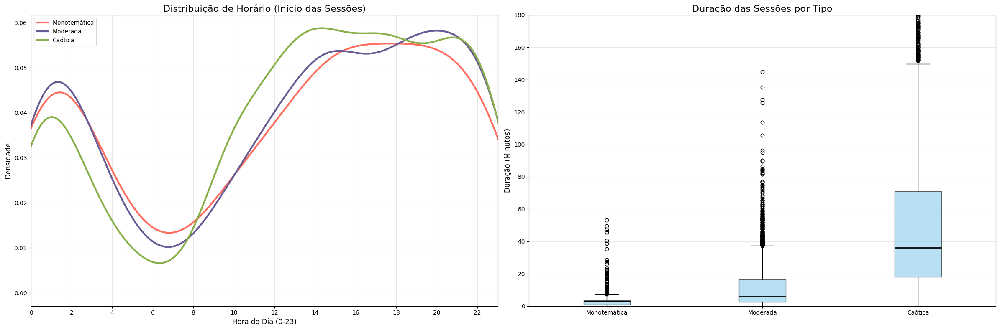

Média de duração (minutos) por tipo:
session_type
Caótica         57.02
Moderada        11.42
Monotemática     3.27
Name: duration_min, dtype: float64
==== Usuário: Cury ====


C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['duration_min'] = (user_unique_genre['session_end'] - user_unique_genre['session_start']).dt.total_seconds() / 60
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['start_hour'] = user_unique_genre['session_start'].dt.hour
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:33: Matplotli

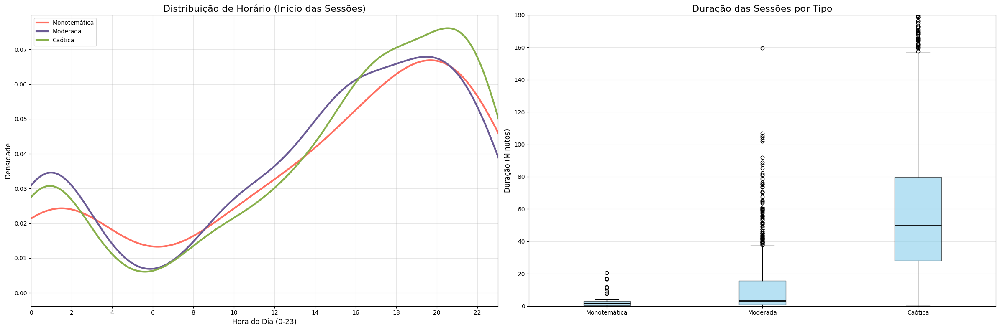

Média de duração (minutos) por tipo:
session_type
Caótica         64.90
Moderada        11.70
Monotemática     2.44
Name: duration_min, dtype: float64
==== Usuário: Allanabre ====


C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['duration_min'] = (user_unique_genre['session_end'] - user_unique_genre['session_start']).dt.total_seconds() / 60
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['start_hour'] = user_unique_genre['session_start'].dt.hour
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:33: Matplotli

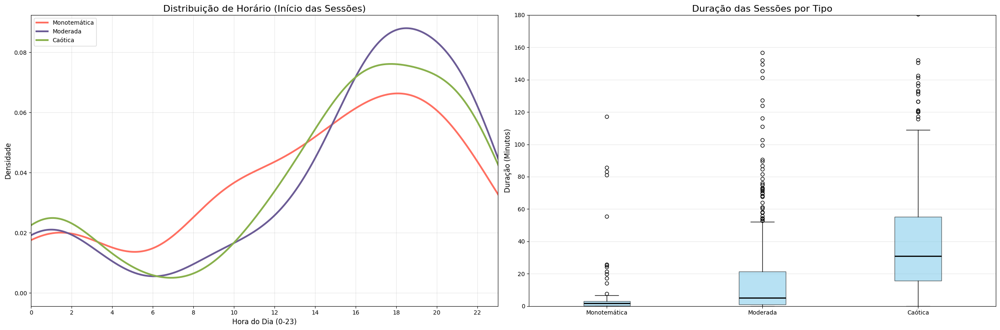

Média de duração (minutos) por tipo:
session_type
Caótica         39.93
Moderada        18.00
Monotemática     5.28
Name: duration_min, dtype: float64
==== Usuário: Fefo ====


C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['duration_min'] = (user_unique_genre['session_end'] - user_unique_genre['session_start']).dt.total_seconds() / 60
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['start_hour'] = user_unique_genre['session_start'].dt.hour
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:33: Matplotli

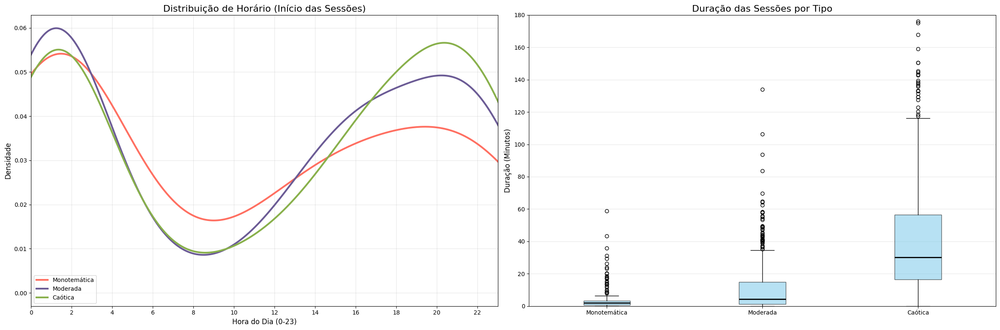

Média de duração (minutos) por tipo:
session_type
Caótica         40.86
Moderada        10.47
Monotemática     4.70
Name: duration_min, dtype: float64
==== Usuário: gigi ====


C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['duration_min'] = (user_unique_genre['session_end'] - user_unique_genre['session_start']).dt.total_seconds() / 60
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_unique_genre['start_hour'] = user_unique_genre['session_start'].dt.hour
C:\Users\migue\AppData\Local\Temp\ipykernel_17100\3119406249.py:33: Matplotli

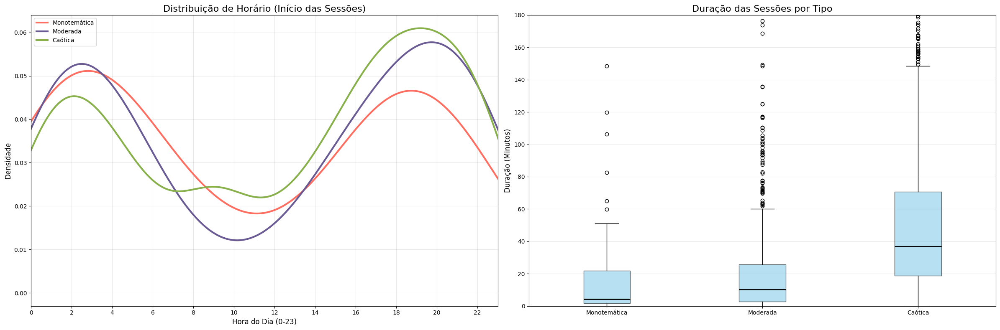

Média de duração (minutos) por tipo:
session_type
Caótica         54.10
Moderada        20.31
Monotemática    16.99
Name: duration_min, dtype: float64


In [43]:
for user in df_session['user'].unique():
    user_unique_genre = unique_genre_per_session[unique_genre_per_session['user'] == user]
    print(f"==== Usuário: {user} ====")
    # Calcula duração em minutos e extrai a hora de início
    user_unique_genre['duration_min'] = (user_unique_genre['session_end'] - user_unique_genre['session_start']).dt.total_seconds() / 60
    user_unique_genre['start_hour'] = user_unique_genre['session_start'].dt.hour

    # Configuração dos plots
    fig, axes = plt.subplots(1, 2, figsize=(24, 8))

    #  Em que horário cada tipo de sessão acontece?
    # Histograma de horário por tipo
    tipos = ['Monotemática', 'Moderada', 'Caótica']
    colors = ['#FF6F61', '#6B5B95', '#88B04B']

    for i, tipo in enumerate(tipos):
        subset = user_unique_genre[user_unique_genre['session_type'] == tipo]
        # Normalizamos (density=True) para comparar a distribuição, já que as quantidades absolutas podem variar muito
        subset['start_hour'].plot(kind='kde', ax=axes[0], label=tipo, color=colors[i], linewidth=3)

    axes[0].set_title("Distribuição de Horário (Início das Sessões)", fontsize=16)
    axes[0].set_xlabel("Hora do Dia (0-23)", fontsize=12)
    axes[0].set_ylabel("Densidade", fontsize=12)
    axes[0].set_xlim(0, 23)
    axes[0].set_xticks(range(0, 24, 2))
    axes[0].grid(True, alpha=0.3)
    axes[0].legend()

    # Quais gêneros formam sessões mais duradouras? (Duração por Tipo)
    # Boxplot para ver a distribuição de duração
    data_to_plot = [user_unique_genre[user_unique_genre['session_type'] == t]['duration_min'] for t in tipos]

    axes[1].boxplot(data_to_plot, labels=tipos, patch_artist=True, 
                    boxprops=dict(facecolor='#87CEEB', alpha=0.6),
                    medianprops=dict(color='black', linewidth=2))

    axes[1].set_title("Duração das Sessões por Tipo", fontsize=16)
    axes[1].set_ylabel("Duração (Minutos)", fontsize=12)
    axes[1].set_ylim(0, 180) # Limitando a 3 horas visuals para não distorcer com outliers extremos
    axes[1].grid(True, axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Resumo estatístico rápido
    print("Média de duração (minutos) por tipo:")
    print(user_unique_genre.groupby('session_type')['duration_min'].mean().round(2))